# FandomFury: l'APP di cui non sapevi di avere bisogno

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

## Importazione dataset come .csv

In [1]:

import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt


#setting della modalità di lavoro del notebook offline: requisito per estrarre
#i graph di plotly, in quanto interattivi
import plotly
plotly.offline.init_notebook_mode()

#creazione dell'istanza del dataset sapendo che l'unità
#di osservazione è rappresentata dalla singola APP
APP = pd.read_csv('googleplaystore.csv')

In [2]:
APP

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10836,Sya9a Maroc - FR,FAMILY,4.5,38,53M,"5,000+",Free,0,Everyone,Education,"July 25, 2017",1.48,4.1 and up
10837,Fr. Mike Schmitz Audio Teachings,FAMILY,5.0,4,3.6M,100+,Free,0,Everyone,Education,"July 6, 2018",1.0,4.1 and up
10838,Parkinson Exercices FR,MEDICAL,NaN,3,9.5M,"1,000+",Free,0,Everyone,Medical,"January 20, 2017",1.0,2.2 and up
10839,The SCP Foundation DB fr nn5n,BOOKS_AND_REFERENCE,4.5,114,Varies with device,"1,000+",Free,0,Mature 17+,Books & Reference,"January 19, 2015",Varies with device,Varies with device


In [3]:
APP.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10841 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10841 non-null  object 
 1   Category        10841 non-null  object 
 2   Rating          9367 non-null   float64
 3   Reviews         10841 non-null  object 
 4   Size            10841 non-null  object 
 5   Installs        10841 non-null  object 
 6   Type            10840 non-null  object 
 7   Price           10841 non-null  object 
 8   Content Rating  10840 non-null  object 
 9   Genres          10841 non-null  object 
 10  Last Updated    10841 non-null  object 
 11  Current Ver     10833 non-null  object 
 12  Android Ver     10838 non-null  object 
dtypes: float64(1), object(12)
memory usage: 1.1+ MB


## Data Cleaning

Individuiamo eventuali _missing value_, _doppioni_ o _conversioni_

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

### Valutando il dataset, risultano **duplicate** diverse APP per **tutte le variabili**
Ci sono dei **doppioni**



In [6]:
##Valutiamo la presenza di duplicati per tutte le variabili
APP.duplicated(subset=list(APP.columns.values)).unique()

array([False,  True])

In [7]:
#A quanto pare esistono
counts = APP.groupby(list(APP.columns.values)).size().reset_index(name='counts')
counts

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,counts
0,+Download 4 Instagram Twitter,SOCIAL,4.5,40467,22M,"1,000,000+",Free,0,Everyone,Social,"August 2, 2018",5.03,4.1 and up,1
1,- Free Comics - Comic Apps,COMICS,3.5,115,9.1M,"10,000+",Free,0,Mature 17+,Comics,"July 13, 2018",5.0.12,5.0 and up,1
2,.R,TOOLS,4.5,259,203k,"10,000+",Free,0,Everyone,Tools,"September 16, 2014",1.1.06,1.5 and up,1
3,/u/app,COMMUNICATION,4.7,573,53M,"10,000+",Free,0,Mature 17+,Communication,"July 3, 2018",4.2.4,4.1 and up,1
4,058.ba,NEWS_AND_MAGAZINES,4.4,27,14M,100+,Free,0,Everyone,News & Magazines,"July 6, 2018",1.0,4.2 and up,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8881,감성학원 BL 첫사랑,COMICS,4.4,190,34M,"10,000+",Free,0,Everyone,Comics,"November 17, 2017",3.2.1,3.0 and up,1
8882,💎 I'm rich,LIFESTYLE,3.8,718,26M,"10,000+",Paid,$399.99,Everyone,Lifestyle,"March 11, 2018",1.0.0,4.4 and up,1
8883,"💘 WhatsLov: Smileys of love, stickers and GIF",SOCIAL,4.6,22098,18M,"1,000,000+",Free,0,Everyone,Social,"July 24, 2018",4.2.4,4.0.3 and up,1
8884,📏 Smart Ruler ↔️ cm/inch measuring for homework!,TOOLS,4.0,19,3.2M,"10,000+",Free,0,Everyone,Tools,"October 21, 2017",1.0,4.2 and up,1


In [8]:
unique = counts[counts['counts'] <= 1]
unique

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,counts
0,+Download 4 Instagram Twitter,SOCIAL,4.5,40467,22M,"1,000,000+",Free,0,Everyone,Social,"August 2, 2018",5.03,4.1 and up,1
1,- Free Comics - Comic Apps,COMICS,3.5,115,9.1M,"10,000+",Free,0,Mature 17+,Comics,"July 13, 2018",5.0.12,5.0 and up,1
2,.R,TOOLS,4.5,259,203k,"10,000+",Free,0,Everyone,Tools,"September 16, 2014",1.1.06,1.5 and up,1
3,/u/app,COMMUNICATION,4.7,573,53M,"10,000+",Free,0,Mature 17+,Communication,"July 3, 2018",4.2.4,4.1 and up,1
4,058.ba,NEWS_AND_MAGAZINES,4.4,27,14M,100+,Free,0,Everyone,News & Magazines,"July 6, 2018",1.0,4.2 and up,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8881,감성학원 BL 첫사랑,COMICS,4.4,190,34M,"10,000+",Free,0,Everyone,Comics,"November 17, 2017",3.2.1,3.0 and up,1
8882,💎 I'm rich,LIFESTYLE,3.8,718,26M,"10,000+",Paid,$399.99,Everyone,Lifestyle,"March 11, 2018",1.0.0,4.4 and up,1
8883,"💘 WhatsLov: Smileys of love, stickers and GIF",SOCIAL,4.6,22098,18M,"1,000,000+",Free,0,Everyone,Social,"July 24, 2018",4.2.4,4.0.3 and up,1
8884,📏 Smart Ruler ↔️ cm/inch measuring for homework!,TOOLS,4.0,19,3.2M,"10,000+",Free,0,Everyone,Tools,"October 21, 2017",1.0,4.2 and up,1


In [9]:
# Filtra solo le righe che hanno più di una occorrenza
duplicates = counts[counts['counts'] > 1]
duplicates

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,counts
6,10 Best Foods for You,HEALTH_AND_FITNESS,4.0,2490,3.8M,"500,000+",Free,0,Everyone 10+,Health & Fitness,"February 17, 2017",1.9,2.3.3 and up,2
18,1800 Contacts - Lens Store,MEDICAL,4.7,23160,26M,"1,000,000+",Free,0,Everyone,Medical,"July 27, 2018",7.4.1,5.0 and up,2
25,2017 EMRA Antibiotic Guide,MEDICAL,4.4,12,3.8M,"1,000+",Paid,$16.99,Everyone,Medical,"January 27, 2017",1.0.5,4.0.3 and up,2
31,21-Day Meditation Experience,HEALTH_AND_FITNESS,4.4,11506,15M,"100,000+",Free,0,Everyone,Health & Fitness,"August 2, 2018",3.0.0,4.1 and up,2
70,420 BZ Budeze Delivery,MEDICAL,5.0,2,11M,100+,Free,0,Mature 17+,Medical,"June 6, 2018",1.0.1,4.1 and up,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8789,mySugr: the blood sugar tracker made just for you,MEDICAL,4.6,21189,36M,"1,000,000+",Free,0,Everyone,Medical,"August 6, 2018",3.52.1,5.0 and up,2
8816,slither.io,GAME,4.4,5235294,Varies with device,"100,000,000+",Free,0,Everyone,Action,"November 14, 2017",Varies with device,2.3 and up,2
8831,"theScore: Live Sports Scores, News, Stats & Vi...",SPORTS,4.4,133825,34M,"10,000,000+",Free,0,Everyone 10+,Sports,"July 25, 2018",6.17.2,4.4 and up,2
8832,"theScore: Live Sports Scores, News, Stats & Vi...",SPORTS,4.4,133833,34M,"10,000,000+",Free,0,Everyone 10+,Sports,"July 25, 2018",6.17.2,4.4 and up,3


#### Esempio di *duplicato*: *`trivago: Hotels & Travel`* e *`10 Best Foods for You`*

In [18]:
##esempio
APP.loc[APP['App']== 'trivago: Hotels & Travel']

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
3103,trivago: Hotels & Travel,TRAVEL_AND_LOCAL,4.2,219848,Varies with device,"50,000,000+",Free,0,Everyone,Travel & Local,"August 2, 2018",Varies with device,Varies with device
3118,trivago: Hotels & Travel,TRAVEL_AND_LOCAL,4.2,219848,Varies with device,"50,000,000+",Free,0,Everyone,Travel & Local,"August 2, 2018",Varies with device,Varies with device
3202,trivago: Hotels & Travel,TRAVEL_AND_LOCAL,4.2,219848,Varies with device,"50,000,000+",Free,0,Everyone,Travel & Local,"August 2, 2018",Varies with device,Varies with device


In [20]:
APP.loc[APP['App'] == '10 Best Foods for You']

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
1393,10 Best Foods for You,HEALTH_AND_FITNESS,4.0,2490,3.8M,"500,000+",Free,0,Everyone 10+,Health & Fitness,"February 17, 2017",1.9,2.3.3 and up
1407,10 Best Foods for You,HEALTH_AND_FITNESS,4.0,2490,3.8M,"500,000+",Free,0,Everyone 10+,Health & Fitness,"February 17, 2017",1.9,2.3.3 and up


#### Occorre **ripulire il dataset dei doppioni** e valutarne altri in base ad _altri criteri più stringenti_ - magari per **subset di variabili**
> Inoltre operiamo per il `reset_index`, riclassificando e risenquenzializzando l'originale

In [23]:
APP.drop_duplicates(inplace=True)
APP = APP.reset_index(drop=True)
APP

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10353,Sya9a Maroc - FR,FAMILY,4.5,38,53M,"5,000+",Free,0,Everyone,Education,"July 25, 2017",1.48,4.1 and up
10354,Fr. Mike Schmitz Audio Teachings,FAMILY,5.0,4,3.6M,100+,Free,0,Everyone,Education,"July 6, 2018",1.0,4.1 and up
10355,Parkinson Exercices FR,MEDICAL,NaN,3,9.5M,"1,000+",Free,0,Everyone,Medical,"January 20, 2017",1.0,2.2 and up
10356,The SCP Foundation DB fr nn5n,BOOKS_AND_REFERENCE,4.5,114,Varies with device,"1,000+",Free,0,Mature 17+,Books & Reference,"January 19, 2015",Varies with device,Varies with device


In [25]:
APP.loc[APP['App'] == 'trivago: Hotels & Travel']

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
2708,trivago: Hotels & Travel,TRAVEL_AND_LOCAL,4.2,219848,Varies with device,"50,000,000+",Free,0,Everyone,Travel & Local,"August 2, 2018",Varies with device,Varies with device


In [27]:
APP.loc[APP['App'] == '10 Best Foods for You']

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
1225,10 Best Foods for You,HEALTH_AND_FITNESS,4.0,2490,3.8M,"500,000+",Free,0,Everyone 10+,Health & Fitness,"February 17, 2017",1.9,2.3.3 and up


In [29]:
APP.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10358 entries, 0 to 10357
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10358 non-null  object 
 1   Category        10358 non-null  object 
 2   Rating          8893 non-null   float64
 3   Reviews         10358 non-null  object 
 4   Size            10358 non-null  object 
 5   Installs        10358 non-null  object 
 6   Type            10357 non-null  object 
 7   Price           10358 non-null  object 
 8   Content Rating  10357 non-null  object 
 9   Genres          10358 non-null  object 
 10  Last Updated    10358 non-null  object 
 11  Current Ver     10350 non-null  object 
 12  Android Ver     10355 non-null  object 
dtypes: float64(1), object(12)
memory usage: 1.0+ MB


#### Esistono ulteriormente dei doppioni per questa lista `varlist`: variano per `Category` e/o `Reviews`

In [32]:
varlist = ['App', 'Rating', 'Size', 'Installs', 'Type', 'Price', 'Content Rating', 'Genres','Last Updated', 'Current Ver', 'Android Ver']
APP.duplicated(subset=varlist).unique()

array([False,  True])

In [34]:
counts = APP.groupby(varlist).size().reset_index(name='counts')
counts

,App,Rating,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,counts
0,+Download 4 Instagram Twitter,4.5,22M,"1,000,000+",Free,0,Everyone,Social,"August 2, 2018",5.03,4.1 and up,1
1,- Free Comics - Comic Apps,3.5,9.1M,"10,000+",Free,0,Mature 17+,Comics,"July 13, 2018",5.0.12,5.0 and up,1
2,.R,4.5,203k,"10,000+",Free,0,Everyone,Tools,"September 16, 2014",1.1.06,1.5 and up,1
3,/u/app,4.7,53M,"10,000+",Free,0,Mature 17+,Communication,"July 3, 2018",4.2.4,4.1 and up,1
4,058.ba,4.4,14M,100+,Free,0,Everyone,News & Magazines,"July 6, 2018",1.0,4.2 and up,1
...,...,...,...,...,...,...,...,...,...,...,...,...
8232,감성학원 BL 첫사랑,4.4,34M,"10,000+",Free,0,Everyone,Comics,"November 17, 2017",3.2.1,3.0 and up,1
8233,💎 I'm rich,3.8,26M,"10,000+",Paid,$399.99,Everyone,Lifestyle,"March 11, 2018",1.0.0,4.4 and up,1
8234,"💘 WhatsLov: Smileys of love, stickers and GIF",4.6,18M,"1,000,000+",Free,0,Everyone,Social,"July 24, 2018",4.2.4,4.0.3 and up,1
8235,📏 Smart Ruler ↔️ cm/inch measuring for homework!,4.0,3.2M,"10,000+",Free,0,Everyone,Tools,"October 21, 2017",1.0,4.2 and up,1


In [36]:
unique = counts[counts['counts'] <= 1]
unique

,App,Rating,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,counts
0,+Download 4 Instagram Twitter,4.5,22M,"1,000,000+",Free,0,Everyone,Social,"August 2, 2018",5.03,4.1 and up,1
1,- Free Comics - Comic Apps,3.5,9.1M,"10,000+",Free,0,Mature 17+,Comics,"July 13, 2018",5.0.12,5.0 and up,1
2,.R,4.5,203k,"10,000+",Free,0,Everyone,Tools,"September 16, 2014",1.1.06,1.5 and up,1
3,/u/app,4.7,53M,"10,000+",Free,0,Mature 17+,Communication,"July 3, 2018",4.2.4,4.1 and up,1
4,058.ba,4.4,14M,100+,Free,0,Everyone,News & Magazines,"July 6, 2018",1.0,4.2 and up,1
...,...,...,...,...,...,...,...,...,...,...,...,...
8232,감성학원 BL 첫사랑,4.4,34M,"10,000+",Free,0,Everyone,Comics,"November 17, 2017",3.2.1,3.0 and up,1
8233,💎 I'm rich,3.8,26M,"10,000+",Paid,$399.99,Everyone,Lifestyle,"March 11, 2018",1.0.0,4.4 and up,1
8234,"💘 WhatsLov: Smileys of love, stickers and GIF",4.6,18M,"1,000,000+",Free,0,Everyone,Social,"July 24, 2018",4.2.4,4.0.3 and up,1
8235,📏 Smart Ruler ↔️ cm/inch measuring for homework!,4.0,3.2M,"10,000+",Free,0,Everyone,Tools,"October 21, 2017",1.0,4.2 and up,1


In [38]:
duplicates = counts[counts['counts'] > 1]
duplicates

,App,Rating,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,counts
50,365Scores - Live Scores,4.6,25M,"10,000,000+",Free,0,Everyone,Sports,"July 29, 2018",5.5.9,4.1 and up,2
91,8 Ball Pool,4.5,52M,"100,000,000+",Free,0,Everyone,Sports,"July 31, 2018",4.0.0,4.0.3 and up,7
94,95Live -SG#1 Live Streaming App,4.1,15M,"1,000,000+",Free,0,Teen,Dating,"August 1, 2018",8.7.2,4.2 and up,2
104,A&E - Watch Full Episodes of TV Shows,4.0,19M,"1,000,000+",Free,0,Teen,Entertainment,"July 16, 2018",3.1.4,4.4 and up,2
133,AC - Tips & News for Android™,4.2,14M,"1,000,000+",Free,0,Everyone 10+,News & Magazines,"May 24, 2018",3.1.12,4.1 and up,2
...,...,...,...,...,...,...,...,...,...,...,...,...
8171,slither.io,4.4,Varies with device,"100,000,000+",Free,0,Everyone,Action,"November 14, 2017",Varies with device,2.3 and up,5
8172,stranger chat - anonymous chat,3.5,6.1M,"1,000,000+",Free,0,Mature 17+,Dating,"July 7, 2018",2.4.1,4.1 and up,2
8179,textPlus: Free Text & Calls,4.1,28M,"10,000,000+",Free,0,Everyone,Social,"July 26, 2018",7.3.1,4.1 and up,2
8184,"theScore: Live Sports Scores, News, Stats & Vi...",4.4,34M,"10,000,000+",Free,0,Everyone 10+,Sports,"July 25, 2018",6.17.2,4.4 and up,2


Valutiamo a **campione** quali sono le motivazioni specifiche che spiegano i doppioni

In [41]:
APP.loc[APP['App'] == '8 Ball Pool']

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
1468,8 Ball Pool,GAME,4.5,14198297,52M,"100,000,000+",Free,0,Everyone,Sports,"July 31, 2018",4.0.0,4.0.3 and up
1496,8 Ball Pool,GAME,4.5,14198602,52M,"100,000,000+",Free,0,Everyone,Sports,"July 31, 2018",4.0.0,4.0.3 and up
1544,8 Ball Pool,GAME,4.5,14200344,52M,"100,000,000+",Free,0,Everyone,Sports,"July 31, 2018",4.0.0,4.0.3 and up
1628,8 Ball Pool,GAME,4.5,14200550,52M,"100,000,000+",Free,0,Everyone,Sports,"July 31, 2018",4.0.0,4.0.3 and up
1654,8 Ball Pool,GAME,4.5,14201891,52M,"100,000,000+",Free,0,Everyone,Sports,"July 31, 2018",4.0.0,4.0.3 and up
1744,8 Ball Pool,GAME,4.5,14201604,52M,"100,000,000+",Free,0,Everyone,Sports,"July 31, 2018",4.0.0,4.0.3 and up
3508,8 Ball Pool,SPORTS,4.5,14184910,52M,"100,000,000+",Free,0,Everyone,Sports,"July 31, 2018",4.0.0,4.0.3 and up


Come è possibile osservare, `8 Ball Pool` si replica per ben 7 volte, avendo la sola variazione della `Category`, mentre `Reviews` tutte diverse.

In [44]:
APP.loc[APP['App'] == 'slither.io']

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
1452,slither.io,GAME,4.4,5234162,Varies with device,"100,000,000+",Free,0,Everyone,Action,"November 14, 2017",Varies with device,2.3 and up
1525,slither.io,GAME,4.4,5234825,Varies with device,"100,000,000+",Free,0,Everyone,Action,"November 14, 2017",Varies with device,2.3 and up
1545,slither.io,GAME,4.4,5234810,Varies with device,"100,000,000+",Free,0,Everyone,Action,"November 14, 2017",Varies with device,2.3 and up
1674,slither.io,GAME,4.4,5235294,Varies with device,"100,000,000+",Free,0,Everyone,Action,"November 14, 2017",Varies with device,2.3 and up
3774,slither.io,GAME,4.4,5231553,Varies with device,"100,000,000+",Free,0,Everyone,Action,"November 14, 2017",Varies with device,2.3 and up


In questo caso cambiano solo le `Review`

Decido di eliminare i duplicati per questa lista, mantenendo il **primo**

In [48]:
APP.drop_duplicates(subset=varlist, inplace=True, keep = 'first')
APP = APP.reset_index(drop=True)
APP

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9703,Sya9a Maroc - FR,FAMILY,4.5,38,53M,"5,000+",Free,0,Everyone,Education,"July 25, 2017",1.48,4.1 and up
9704,Fr. Mike Schmitz Audio Teachings,FAMILY,5.0,4,3.6M,100+,Free,0,Everyone,Education,"July 6, 2018",1.0,4.1 and up
9705,Parkinson Exercices FR,MEDICAL,NaN,3,9.5M,"1,000+",Free,0,Everyone,Medical,"January 20, 2017",1.0,2.2 and up
9706,The SCP Foundation DB fr nn5n,BOOKS_AND_REFERENCE,4.5,114,Varies with device,"1,000+",Free,0,Mature 17+,Books & Reference,"January 19, 2015",Varies with device,Varies with device


In [50]:
APP.loc[APP['App'] == '8 Ball Pool']

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
1378,8 Ball Pool,GAME,4.5,14198297,52M,"100,000,000+",Free,0,Everyone,Sports,"July 31, 2018",4.0.0,4.0.3 and up


In [52]:
APP.loc[APP['App'] == 'slither.io']

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
1362,slither.io,GAME,4.4,5234162,Varies with device,"100,000,000+",Free,0,Everyone,Action,"November 14, 2017",Varies with device,2.3 and up


### Data Cleaning: Reviews

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

La variabile `Reviews` dovrebbe mostrare la **distribuzione assoluta** delle
reviews tra le app. Questa è però è formattata come `object`.

In [56]:

print(APP.Reviews.describe())
print(APP.Reviews.min())
print(APP.Reviews.max())

count     9708
unique    5373
top          0
freq       593
Name: Reviews, dtype: object
0
9992


Risulta necessario approfondire lo studio, per capire il **motivo di tale codifica**

#### Il comando 'APP.Reviews.astype(int)' ritorna il seguente errore di conversione `invalid literal for int() with base 10: '3.0M'`

Ma dove è situata tale riga?

In [60]:
APP.loc[APP['Reviews'] == '3.0M']

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
9346,Life Made WI-Fi Touchscreen Photo Frame,1.9,19.0,3.0M,"1,000+",Free,0,Everyone,NaN,"February 11, 2018",1.0.19,4.0 and up,NaN


#### Risulterebbe almeno una riga, la 9346, con valore a `3.0M`, ad indicare che l'app avrebbe 1 Milione di reviews moltiplicato per il coefficiente 3.0 = 3 milioni

Tale formattazione ci suggerisce di provare ad **estrarre il formato** ed usarlo come **_moltiplicatore_** -> `k M = k * 10^6 (Millions)`

In [63]:
sostit = APP.Reviews.replace(r'[M]+$', '', regex=True).astype(float)

## in assenza di qualunque MOLTIPLICATORE, il campo viene sostituito da un '1'
misura = APP.Reviews.str.extract(r'[\d\.]+([M]+)', expand=False).fillna(1)
print(misura.unique())
print(misura.loc[misura == 'M'])

[1 'M']
9346    M
Name: Reviews, dtype: object


#### Effettivamente risultano due `Moltiplicatori: [1 e 'M']` e l'unica riga che usa un moltiplicatore è la 9346

In [66]:
change = sostit * misura.replace(['M'], [10**6]).astype(int)
change[9346]




C:\Users\Matteo Biasio\AppData\Local\Temp\ipykernel_276\493337322.py:1: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



3000000.0

#### Come possiamo notare ora, il campo formattato erroneamente è stato trasformato utilizzando il **moltiplicatore** per convertire la variabile in numero
L'idea è di rendere la modifica **definitiva**

In [69]:
APP.Reviews = change
#print di conferma
APP.iloc[9346]


App               Life Made WI-Fi Touchscreen Photo Frame
Category                                              1.9
Rating                                               19.0
Reviews                                         3000000.0
Size                                               1,000+
Installs                                             Free
Type                                                    0
Price                                            Everyone
Content Rating                                        NaN
Genres                                  February 11, 2018
Last Updated                                       1.0.19
Current Ver                                    4.0 and up
Android Ver                                           NaN
Name: 9346, dtype: object

In [71]:
APP.Reviews.astype(int)
print(APP.Reviews)

0          159.0
1          967.0
2        87510.0
3       215644.0
4          967.0
          ...   
9703        38.0
9704         4.0
9705         3.0
9706       114.0
9707    398307.0
Name: Reviews, Length: 9708, dtype: float64


In [73]:
APP.Reviews.max()

78158306.0

#### Il nuovo massimo è diverso, molto probabilmente è dovuto al fatto che funzione `max()` ritornava il massimo valore rappresentato nella codifica della variabile `Review` come variabile oggetto



### Data Cleaning: Rating

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

Eliminazione di **valutazioni erronee** e valutazione di classificazione sul **Rating mancante**

In [78]:
print(APP.Rating[pd.isnull(APP.Rating)])



23     NaN
113    NaN
123    NaN
126    NaN
129    NaN
        ..
9691   NaN
9692   NaN
9698   NaN
9702   NaN
9705   NaN
Name: Rating, Length: 1464, dtype: float64


#### Notiamo 1464 valori mancanti nella classificazione del sistema di `Rating`

In [81]:
print(APP.Rating.unique())

[ 4.1  3.9  4.7  4.5  4.3  4.4  3.8  4.2  4.6  3.2  4.   nan  4.8  4.9
  3.6  3.7  3.3  3.4  3.5  3.1  5.   2.6  3.   1.9  2.5  2.8  2.7  1.
  2.9  2.3  2.2  1.7  2.   1.8  2.4  1.6  2.1  1.4  1.5  1.2 19. ]


#### Così come una classificazione erronea: `19.`

In [84]:
print(APP.groupby('Rating').count())

        App  Category  Reviews  Size  Installs  Type  Price  Content Rating  \
Rating                                                                        
1.0      16        16       16    16        16    16     16              16   
1.2       1         1        1     1         1     1      1               1   
1.4       3         3        3     3         3     3      3               3   
1.5       3         3        3     3         3     3      3               3   
1.6       4         4        4     4         4     4      4               4   
1.7       8         8        8     8         8     8      8               8   
1.8       8         8        8     8         8     8      8               8   
1.9      11        11       11    11        11    11     11              11   
2.0      12        12       12    12        12    12     12              12   
2.1       8         8        8     8         8     8      8               8   
2.2      14        14       14    14        14    14

#### Abbiamo solo una osservazione, che decidiamo di escludere

In [87]:
APP = APP.drop(APP[APP.Rating > 5.0].index)

In [89]:
print(APP.Rating.unique())

[4.1 3.9 4.7 4.5 4.3 4.4 3.8 4.2 4.6 3.2 4.  nan 4.8 4.9 3.6 3.7 3.3 3.4
 3.5 3.1 5.  2.6 3.  1.9 2.5 2.8 2.7 1.  2.9 2.3 2.2 1.7 2.  1.8 2.4 1.6
 2.1 1.4 1.5 1.2]


In [91]:
print(APP.groupby('Rating').count())

        App  Category  Reviews  Size  Installs  Type  Price  Content Rating  \
Rating                                                                        
1.0      16        16       16    16        16    16     16              16   
1.2       1         1        1     1         1     1      1               1   
1.4       3         3        3     3         3     3      3               3   
1.5       3         3        3     3         3     3      3               3   
1.6       4         4        4     4         4     4      4               4   
1.7       8         8        8     8         8     8      8               8   
1.8       8         8        8     8         8     8      8               8   
1.9      11        11       11    11        11    11     11              11   
2.0      12        12       12    12        12    12     12              12   
2.1       8         8        8     8         8     8      8               8   
2.2      14        14       14    14        14    14

In [93]:
APP.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9707 entries, 0 to 9707
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             9707 non-null   object 
 1   Category        9707 non-null   object 
 2   Rating          8243 non-null   float64
 3   Reviews         9707 non-null   float64
 4   Size            9707 non-null   object 
 5   Installs        9707 non-null   object 
 6   Type            9706 non-null   object 
 7   Price           9707 non-null   object 
 8   Content Rating  9707 non-null   object 
 9   Genres          9707 non-null   object 
 10  Last Updated    9707 non-null   object 
 11  Current Ver     9699 non-null   object 
 12  Android Ver     9705 non-null   object 
dtypes: float64(2), object(11)
memory usage: 1.0+ MB


Decido di creare una **variabile categorica** atta a rappresentazione
del sistema di valutazione del `Rating` sottoforma di _**classi**_
> **Gravemente insufficiente**: valutazione tra `(0,1]`
> 
> **Insufficiente**: `(1,2]`
> 
> **Scarso**: `(2,3]`
> 
> **Sufficiente-Buono**: `(3-4]`
> 
> **Ottimo**: `(4-5]`
>
> **Mancante**: `[NaN]`

In [96]:
#definisco la nuova colonna in modo condizionato
APP['Rating_Category'] = 'Mancante'  # Inizializzo la colonna with 'Mancante' come default
 
# Uso DataFrame.loc[] per settare i valori in base alla condizione
APP.loc[APP['Rating'] > 0, 'Rating_Category'] = 'Gravemente Insufficiente'
APP.loc[APP['Rating'] > 1, 'Rating_Category'] = 'Insufficiente'
APP.loc[APP['Rating'] > 2, 'Rating_Category'] = 'Scarso'
APP.loc[APP['Rating'] > 3, 'Rating_Category'] = 'Sufficiente-Buono'
APP.loc[APP['Rating'] > 4, 'Rating_Category'] = 'Ottimo'

In [98]:
APP.groupby(['Rating','Rating_Category']).count()

,,App,Category,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
Rating,Rating_Category,,,,,,,,,,,,
1.0,Gravemente Insufficiente,16,16,16,16,16,16,16,16,16,16,16,16
1.2,Insufficiente,1,1,1,1,1,1,1,1,1,1,1,1
1.4,Insufficiente,3,3,3,3,3,3,3,3,3,3,3,3
1.5,Insufficiente,3,3,3,3,3,3,3,3,3,3,3,3
1.6,Insufficiente,4,4,4,4,4,4,4,4,4,4,4,4
1.7,Insufficiente,8,8,8,8,8,8,8,8,8,8,8,8
1.8,Insufficiente,8,8,8,8,8,8,8,8,8,8,8,8
1.9,Insufficiente,11,11,11,11,11,11,11,11,11,11,11,11
2.0,Insufficiente,12,12,12,12,12,12,12,12,12,12,12,12


### Data cleaning - Type

In [101]:
APP.isnull().sum()

App                   0
Category              0
Rating             1464
Reviews               0
Size                  0
Installs              0
Type                  1
Price                 0
Content Rating        0
Genres                0
Last Updated          0
Current Ver           8
Android Ver           2
Rating_Category       0
dtype: int64

Decido di eliminare le osservazioni per cui abbiamo `missing value`, in quanto residuali

In [104]:
APP = APP[APP['Type'].notna() & APP['Current Ver'].notna() & APP['Android Ver'].notna()]

In [106]:
APP.isnull().sum()

App                   0
Category              0
Rating             1459
Reviews               0
Size                  0
Installs              0
Type                  0
Price                 0
Content Rating        0
Genres                0
Last Updated          0
Current Ver           0
Android Ver           0
Rating_Category       0
dtype: int64

In [108]:
APP.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9696 entries, 0 to 9707
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   App              9696 non-null   object 
 1   Category         9696 non-null   object 
 2   Rating           8237 non-null   float64
 3   Reviews          9696 non-null   float64
 4   Size             9696 non-null   object 
 5   Installs         9696 non-null   object 
 6   Type             9696 non-null   object 
 7   Price            9696 non-null   object 
 8   Content Rating   9696 non-null   object 
 9   Genres           9696 non-null   object 
 10  Last Updated     9696 non-null   object 
 11  Current Ver      9696 non-null   object 
 12  Android Ver      9696 non-null   object 
 13  Rating_Category  9696 non-null   object 
dtypes: float64(2), object(12)
memory usage: 1.1+ MB


### Data cleaning - Installs

Al fine di rendere **intera** la variabile del numero di installazioni, anzichè **categorica**
cercherò di eliminare la formattazione con il finale "`+`"
> la scelta è motivata dal fatto di voler utilizzare la variabile come strumento per le **correlazioni**
> in quanto, di norma, si richiedono _**variabili intere**_;
>
> i valori generati sono **indicativi**, appartenenti a _classi di valori_ e non a valori nominali; potranno
> essere utilizzabili anche per **heat maps**
>
La scelta di renderli **interi** è motivata dal fatto di avere semplicemente una maggiore _duttilità nelle rappresentazioni grafiche_

#### Eliminazione dei separatori delle migliaia e del "+" a fondo stringa

In [113]:

APP['Installs'] = APP['Installs'].str.replace(',', '').str.replace('+', '').astype(int)

APP


,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Rating_Category
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159.0,19M,10000,Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up,Ottimo
1,Coloring book moana,ART_AND_DESIGN,3.9,967.0,14M,500000,Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up,Sufficiente-Buono
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510.0,8.7M,5000000,Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up,Ottimo
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644.0,25M,50000000,Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up,Ottimo
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967.0,2.8M,100000,Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up,Ottimo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9703,Sya9a Maroc - FR,FAMILY,4.5,38.0,53M,5000,Free,0,Everyone,Education,"July 25, 2017",1.48,4.1 and up,Ottimo
9704,Fr. Mike Schmitz Audio Teachings,FAMILY,5.0,4.0,3.6M,100,Free,0,Everyone,Education,"July 6, 2018",1.0,4.1 and up,Ottimo
9705,Parkinson Exercices FR,MEDICAL,NaN,3.0,9.5M,1000,Free,0,Everyone,Medical,"January 20, 2017",1.0,2.2 and up,Mancante
9706,The SCP Foundation DB fr nn5n,BOOKS_AND_REFERENCE,4.5,114.0,Varies with device,1000,Free,0,Mature 17+,Books & Reference,"January 19, 2015",Varies with device,Varies with device,Ottimo


Tale variabile verrà poi codificata come `Classe` di valori `Installs_Category` per le Statistiche descrittive

### Analisi di Statistica Descrittiva della Serie

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

### `Category`

Cominciamo con la variabile `Category` e valutiamo la sua **distribuzione** tra le categorie `Type` e `Content Rating` 

In [119]:
APP['Category'].value_counts()

Category
FAMILY                 1835
GAME                    963
TOOLS                   829
BUSINESS                421
MEDICAL                 400
PRODUCTIVITY            377
PERSONALIZATION         374
LIFESTYLE               369
FINANCE                 346
SPORTS                  326
COMMUNICATION           316
HEALTH_AND_FITNESS      288
PHOTOGRAPHY             285
NEWS_AND_MAGAZINES      256
SOCIAL                  240
BOOKS_AND_REFERENCE     221
TRAVEL_AND_LOCAL        219
SHOPPING                208
DATING                  172
VIDEO_PLAYERS           165
MAPS_AND_NAVIGATION     133
EDUCATION               119
FOOD_AND_DRINK          114
ENTERTAINMENT           102
AUTO_AND_VEHICLES        85
LIBRARIES_AND_DEMO       83
WEATHER                  80
HOUSE_AND_HOME           74
EVENTS                   64
ART_AND_DESIGN           63
PARENTING                60
COMICS                   56
BEAUTY                   53
Name: count, dtype: int64

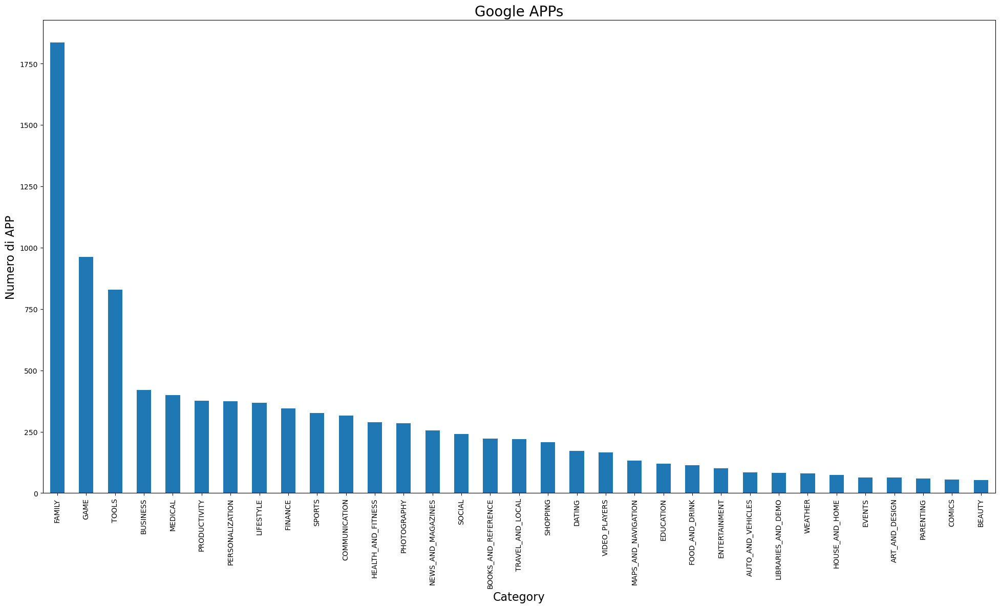

In [121]:
APP['Category'].value_counts().plot(kind='bar', figsize=(24,12)) # Grafico a barre per categorie
plt.title('Google APPs', fontsize=20)
plt.xlabel('Category', fontsize=16)
plt.ylabel('Numero di APP', fontsize=16)
plt.show()

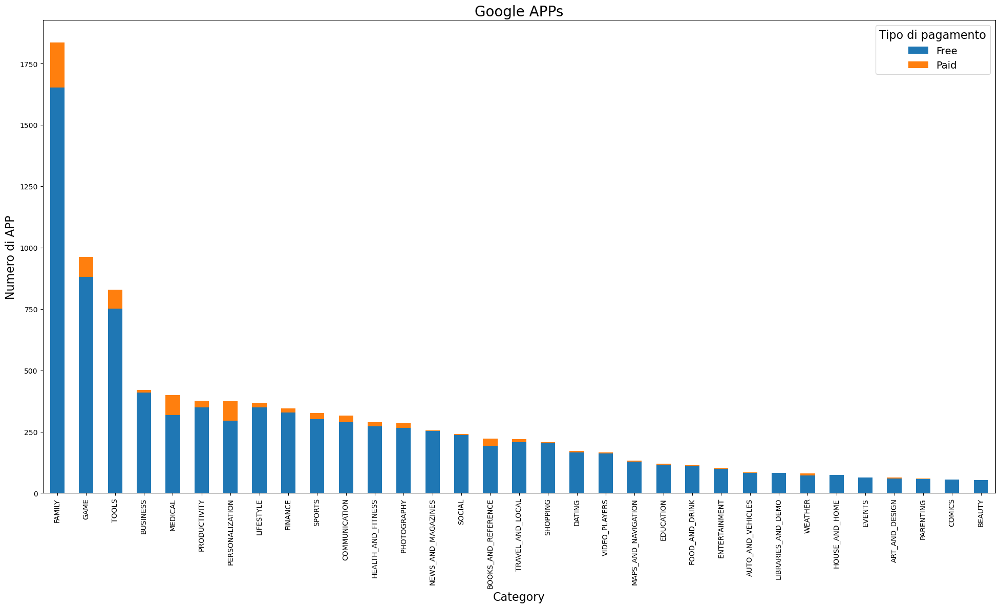

In [122]:
# Contiamo le occorrenze di ognuna delle combinazioni di 'Category' e 'Type'
# Calcolo i totali per ciascuna categoria delle APP
# Ordiniamo le categorie in base ai totali in ordine decrescente
category_type = APP.groupby(['Category', 'Type']).size().unstack().fillna(0)
category_totals = category_type.sum(axis=1).sort_values(ascending=False)
category_type = category_type.loc[category_totals.index]

#versione del bar chart stacked
category_type.plot(kind='bar', stacked=True, figsize=(24, 12))

#edit grafico
plt.title('Google APPs', fontsize=20)
plt.xlabel('Category', fontsize=16)
plt.ylabel('Numero di APP', fontsize=16)
plt.legend(title='Tipo di pagamento', title_fontsize=16, fontsize=14)
plt.show()

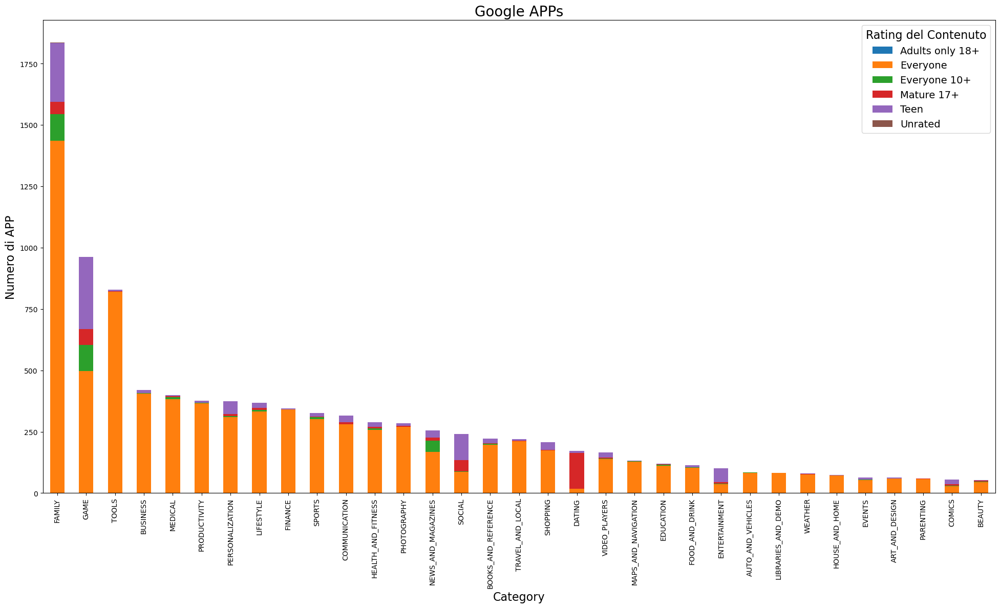

In [125]:
# Contiamo le occorrenze di ognuna delle combinazioni di 'Category' e 'Content Rating'
# Calcolo i totali per ciascuna categoria delle APP
# Ordiniamo le categorie in base ai totali in ordine decrescente
category_content = APP.groupby(['Category', 'Content Rating']).size().unstack().fillna(0)
category_totals = category_content.sum(axis=1).sort_values(ascending=False)
category_content = category_content.loc[category_totals.index]

#versione del bar chart stacked
category_content.plot(kind='bar', stacked=True, figsize=(24, 12))

#edit grafico
plt.title('Google APPs', fontsize=20)
plt.xlabel('Category', fontsize=16)
plt.ylabel('Numero di APP', fontsize=16)
plt.legend(title='Rating del Contenuto', title_fontsize=16, fontsize=14)
plt.show()

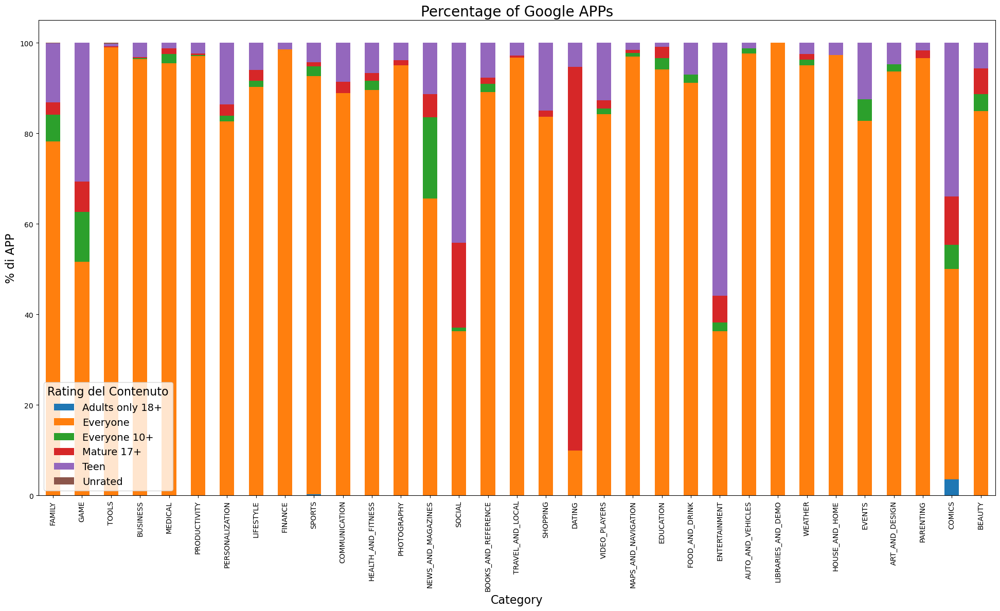

In [126]:
# Contiamo le occorrenze di ognuna delle combinazioni di 'Category' e 'Content Rating'
category_content = APP.groupby(['Category', 'Content Rating']).size().unstack().fillna(0)


# Calcolo i totali per ciascuna categoria delle APP
category_totals = category_content.sum(axis=1)

#Rivisitiamo il tutto come percentuale di categoria
category_content_percent = category_content.div(category_totals, axis=0) * 100

#Ordiniamo le categorie in base ai totali in ordine decrescente
category_totals_sorted = category_totals.sort_values(ascending=False)
category_content_percent = category_content_percent.loc[category_totals_sorted.index]

#versione del bar chart stacked
ax = category_content_percent.plot(kind='bar', stacked=True, figsize=(24, 12))

#edit grafico
plt.title('Percentage of Google APPs', fontsize=20)
plt.xlabel('Category', fontsize=16)
plt.ylabel('% di APP', fontsize=16)
plt.legend(title='Rating del Contenuto', title_fontsize=16, fontsize=14)
plt.show()

> Come può essere facilmente intuibile, con i Grafici a barre **Assoluti** e **Percentuale di categoria** la maggioranza delle APP viene fornita agli utenti **senza la corresponsione di un contributo economico**
> a _prescindere dalla categoria proposta_
>
> Inoltre, in linea con la politica del Play Store di Google, la maggioranza delle APP sono indirizzate a utenti **di qualunque età**, fatto
> salvo per alcune categorie, quali `Family`, `Game`, `Social`, `Entertainment` e `Comics`, per cui comincia ad esserci una _ristrettezza_ ad
> essere almeno in età adolescenziale `Teen`.
>
> `Social` e `Dating` infine, in modo anche abbastanza intituivo date le categorie, mostrano una buona fetta di APP indirizzate utenti con **almeno 17 anni** (in modo particolare per il `Dating`)

Il tutto è comunque interpretabile in ragione delle rappresentazioni assolute e/o percentuali: ricordiamoci quali siano le quote di mercato in gioco e quali siano le categorie più densamente popolate

### `Content Rating` e `Type`

Proseguiamo con le Variabili `Content Rating` e `Type`.
Utilizzo il `Pie Chart` della libreria `plotly.express`

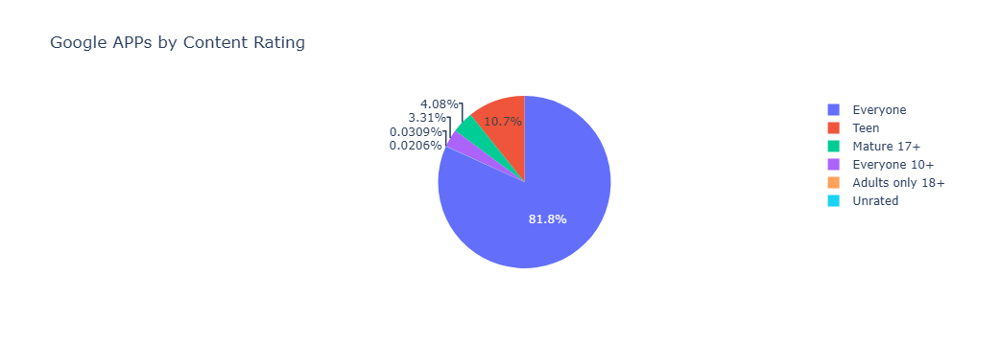

In [132]:
CR = APP['Content Rating'].value_counts().to_frame(name='Count')
CR = CR.reset_index()

fig = px.pie(CR, values='Count', names='Content Rating', title = 'Google APPs by Content Rating')
fig.show()

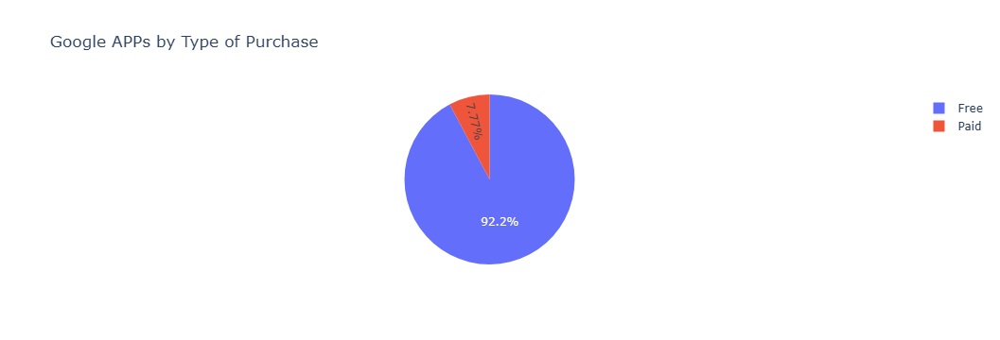

In [134]:


TP = APP['Type'].value_counts().to_frame(name='Count')
TP = TP.reset_index()
#mah
fig = px.pie(TP, values='Count', names='Type', title = 'Google APPs by Type of Purchase')
fig.show()

Come illustrato dai `Pie Chart`, il dataset propone una distribuzione delle APP ineccepibile
> Sono erogate per lo più APP il cui contenuto è indirizzabile ad un **pubblico ad ampio spettro**, qualunque sia la sua età.
> La fetta indirizzata ad un **solo pubblico più o meno adulto** (usando una classificazione simile all'`IARC` [International Age Rating Coalition]
> o quella europea `PEGI` di derivazione gaming) è molto ristretta
>
> La quasi totalità delle APP viene fornita senza l'elargizione di **alcun contributo economico** da parte
> dell'utente.

Tale distribuzione risulta in linea con quanto ribadito dalle politiche Google per gli sviluppatori Android [Norme del programma per gli sviluppatori](https://support.google.com/googleplay/android-developer/answer/14906471?hl=it)

#### Stando a quanto appena rappresentato negli **istogrammi**, l'offerta di APP, in relazione a quanto proposto dal dataset, mostra
#### una concorrenza piuttosto agguerrita per quelle rientranti nelle categorie:
> `FAMILY`, `GAME`, `TOOLS` - settori molto prossimi al contesto nucleo famigliare e/o domestico

Occorre, tuttavia, mostrare se la presenza di questi `outliers` nell'offerta di APP sia motivata da una _concorrente domanda_ del bene
in questione (giudicando l'interesse sulla quota di **Installs**), anche integrando il _**sistema di valutazione**_


## Heat Maps
![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

### Numero di Google APPs per Categoria e numero di Downloads - without counts

#### Sulla base dell'ouput possiamo definire delle classi di Valori

In [141]:
print(APP.Installs.sort_values().unique())

[         0          1          5         10         50        100
        500       1000       5000      10000      50000     100000
     500000    1000000    5000000   10000000   50000000  100000000
  500000000 1000000000]


#### Definisco una variabile categorica per `Installs` che raggruppi **Classi di valori**

In [144]:
APP['Installs_Category'] = '0-5K'  # Inizializzo la colonna with 'Mancante' come default
 
# Uso DataFrame.loc[] per settare i valori in base alla condizione
APP.loc[APP['Installs'] >= 5000, 'Installs_Category'] = '5K-500K'
APP.loc[APP['Installs'] >= 500000, 'Installs_Category'] = '500K-5M'
APP.loc[APP['Installs'] >= 5000000, 'Installs_Category'] = '5M-50M'
APP.loc[APP['Installs'] >= 50000000, 'Installs_Category'] = '50M-500M'
APP.loc[APP['Installs'] >= 500000000, 'Installs_Category'] = '500M-1B and more'

#provo a creare un ordinamento customizzato delle categorie
#dava probelemi con la prima categoria '0-1K'
custom_order2 = ['500M-1B and more', '50M-500M', '5M-50M', '500K-5M','5K-500K','0-5K']
APP['Installs_Category'] = pd.Categorical(APP['Installs_Category'], categories=custom_order2, ordered=True)

#### Proviamo ora a dare una rappresentazione di `Installs_Category` usando una `Heat Map`

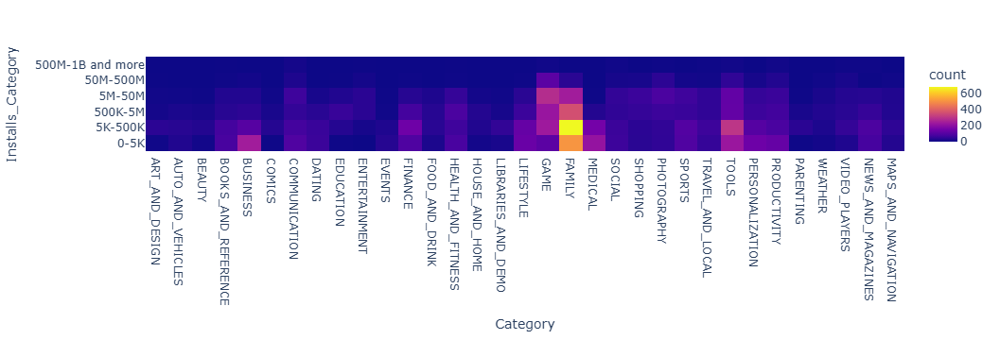

In [147]:
fig = px.density_heatmap(
    APP,
    x='Category',
    y='Installs_Category',
    category_orders={'Installs_Category': custom_order2},
    nbinsx=40,
    nbinsy=40
)

fig.show()

### Numero di Google APPs per Categoria e numero di Downloads - with counts

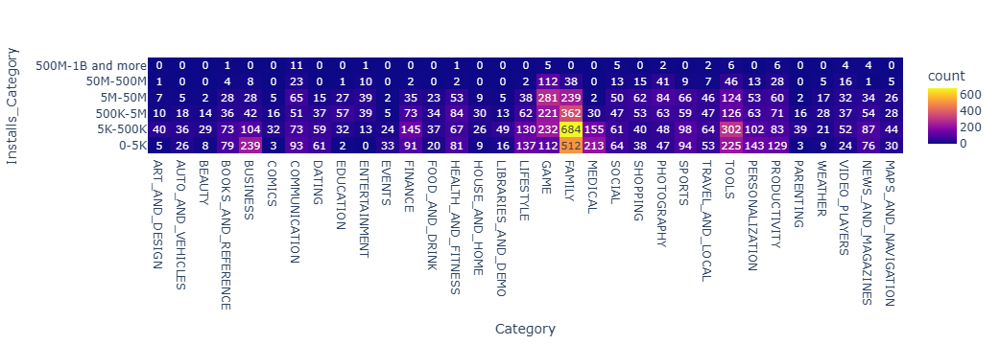

In [150]:
fig = px.density_heatmap(
    APP,
    x='Category',
    y='Installs_Category',
    category_orders={'Installs_Category': custom_order2},
    nbinsx=40,
    nbinsy=40,
    text_auto=True
)
fig.show()

##### Sulla base della classificazione del **numero di installazioni** creata in precedenza, possiamo dare uno sguardo
##### a ciò che le **_density heatmaps_** possono offrirci in termini di **INTERESSE DEGLI UTENTI**:
> Gran parte delle APP si attestano su **quantità di download** _entro i 50 Milioni_, fatta eccezione per `GAME`, dove
> l'interesse, spiegato dalla quantità appena citata, si manifesta anche con un numero di download di APP **superiore ai
> 50 Milioni**
>
> Le categorie che suscitano maggiore interesse continuano ad essere `Family`, `Game`, `Tools`, seguite da `Sports`,`Productivity`,`Health and Fitness` e `Communication`.

#### Questi insights ci danno una idea combinata di quali sono i settori
> **più di interesse** e **più concorrenziali**
>
> ne sono un esempio i settori `Family` e `Game`, che mostrano una **concorrenza elevata** anche a **tassi elevati di download** (esempio: 239 APP `Family` con quantità di Download attestabile nella categoria `5M-50M`, oppure 112 APP `Game` con quantità di Download attestabile nella categoria `50M-500M`). Sono settori cardine, in cui i competitors si suddividono quote di mercato dalle più ampie `5M-50M` alle più ristrette `5K-500K`. Addirittura `Family` raggiunge **tassi di scarico ampi** con **ampia concorrenza** nella classe `0-5K`, raggiungendo probabilmente quote di mercato sempre più risicate (potrebbe trattarsi di APP **appena proposte sul mercato** o orientate ad un **mercato di nicchia**). **SONO SETTORI DI INTERESSE MA ORMAI SATURI**
>
> **più equamente distribuiti, ma comunuqe di interesse**
>
> sono i settori `Communication`, `Social` e `Productivity`: nel primo settore, il livello del numero di APP, al crescere del numero di download - tenendo conto della quanità di concorrenza - ha dei tassi costanti. Per il settore di interesse, vi sono parecchie APP che si spartiscono quote di mercato elevate, fino ad arrivare a quote sempre più di nicchia.

### Numero di Google APPs per Categoria e Rating

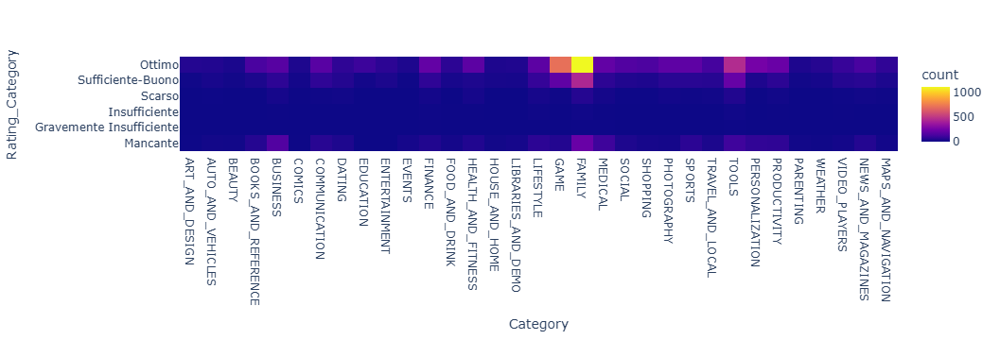

In [154]:
#definizione di un ordine customizzato delle valutazioni
custom_order = ['Ottimo', 'Sufficiente-Buono', 'Scarso', 'Insufficiente','Gravemente Insufficiente','Mancante']
APP['Rating_Category'] = pd.Categorical(APP['Rating_Category'], categories=custom_order, ordered=True)

fig = px.density_heatmap(
    APP,
    x='Category',
    y='Rating_Category',
    category_orders={'Rating_Category': custom_order},
    nbinsx=40,
    nbinsy=40,
)
fig.show()

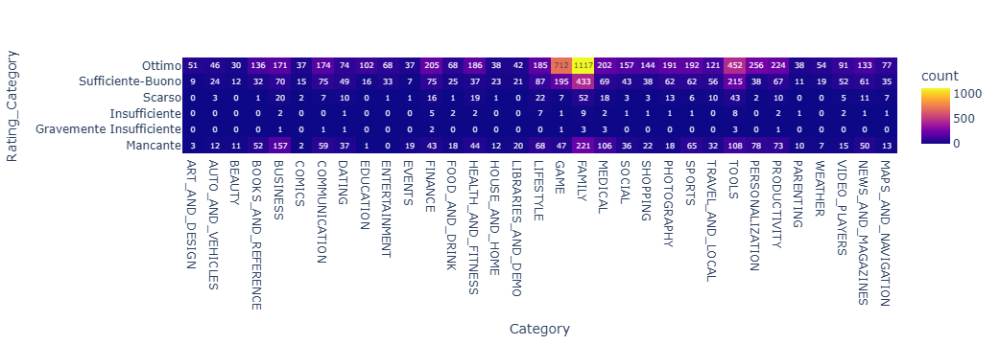

In [156]:
fig = px.density_heatmap(
    APP,
    x='Category',
    y='Rating_Category',
    category_orders={'Rating_Category': custom_order},
    nbinsx=40,
    nbinsy=40,
    text_auto=True
)
fig.show()

#### Come accennato negli step precedenti, ho deciso di creare una **variabile categorica** atta creare dei _cluster_ di `Rating` in modo tale da poter classificare un sistema valutazione - originariamente a valori si discreti, ma con valutazioni decimali - sotto forma di **_classi_**


Le due precedenti density Heat Maps possono mostrarci una sorta di **PARALLELISMO**, per `Category`, tra l'indice di **Interesse (in termini di download) e di concorrenza** e quello di **VALUTAZIONE** delle APP. 
> Sono di norma valutate tutte in modo `Sufficiente-Buono` - `Ottimo` [tra 3 e 5 stelle] con una concentrazione alta tra le categorie `Family`, `Game` e `Tools`, determinato evidentemente dalla **numerosità di APP** presenti per quelle categorie.
>
> C'è una sistematica, seppur debole, correlazione tra la concentrazione di voti **medio-alti**, per categorie, e la **mancanza della valutazione**, sempre per lo stesso motivo

### Numero medio di Reviews per Categorie e Rating

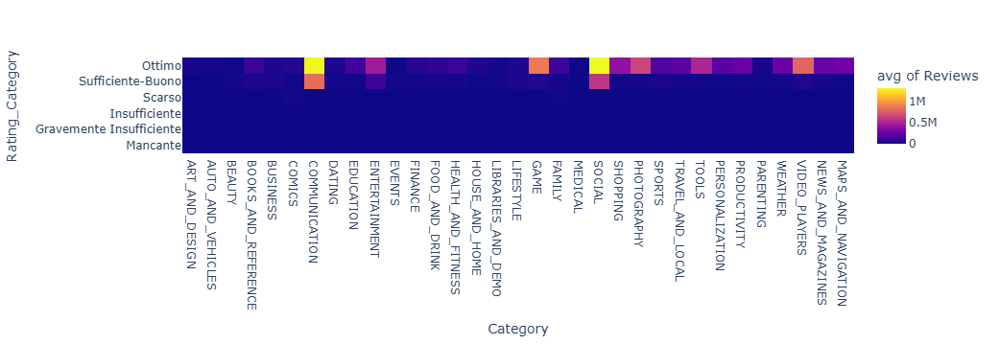

In [160]:
APP

fig = px.density_heatmap(
    APP,
    x='Category',
    y='Rating_Category',
    z='Reviews',
    histfunc="avg",
    category_orders={'Rating_Category': custom_order},
    nbinsx=40,
    nbinsy=40,
    
)

fig.show()


#### Come è possibile osservare con la Heat Map che si può vedere sopra
> i settori `Social`, `Communication`, `Game` godono di un **tasso MEDIO di partecipazione** alle valutazioni molto elevato
> >`Communication` e `Social` sfondano il **_numero medio_** di almeno **2 Milioni di Reviews** per APP **valutate** con valutazione `Ottimo` (4-5]
> >
> > queste mantengono un **tasso medio di partecipazione** alle valutazioni compreso **tra 500 mila e 1 milione** per quelle APP con valutazione `Sufficiente-Buono` (3-4]
> In media notiamo come ci sia un **tasso di partecipazione mediamente elevato**, a prescindere dalla categoria, **per quelle APP valutate con voti Positivi.**
>
> Sarebbe interessante monitorare quale sia l'effetto trainante a spiegare tale fenomeno (sia il numero di download e/o il rating a spiegare il tasso di partecipazione o viceversa). Di logica sembrerebbe che l'**effetto dimensione download** porti ad un risultato, per **partecipazione e rating**, più strutturato
> > L'effetto **_dimensione_** potrebbe portare a scaricare l'APP più con facilità, a lasciare una valutazione sotto forma di **rating** e/o **recensione** più o meno elevata, a patto che l'esperienza complessiva risulti coinvolgente e che la qualità offerta, come features e tasso di crash dell'app (da demandarsi ai tester), siano degne di nota. Il rischio è che si manifesti il cosiddetto **"effetto aspettativa"** per cui risulati disattesi dall'esperienza portino a valutazioni controccorrente.

### Numero medio di Reviews - Scala Logaritmica - per Categorie e Rating

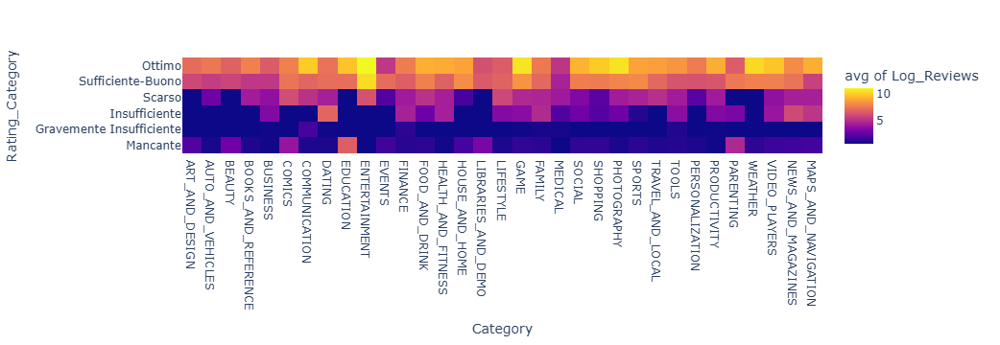

In [164]:
import numpy as np

# Creiamo una colonna logaritmica delle recensioni
APP['Log_Reviews'] = np.log1p(APP['Reviews'])  # np.log1p(x) è equivalente a log(1 + x), gestisce x=0

# Crea la heatmap utilizzando i dati logaritmici. Costruiremo dunque una variabile per la scala
#intesa come media dei logaritmi delle reviews per APP
fig = px.density_heatmap(
    APP,
    x='Category',
    y='Rating_Category',
    z='Log_Reviews',
    histfunc="avg",
    category_orders={'Rating_Category': custom_order},
    nbinsx=40,
    nbinsy=40,
    #text_auto=True
)

# Mostra la heatmap
fig.show()

#### Per rendere la Heat Map precedente più chiara ho deciso di utilizzare una **SCALA LOGARITMICA**
La scelta è motivata dal fatto di voler rendere più evidente una potenziale **_relazione_**, da confermare, tra l'`indice di partecipazione alla valutazione - Reviews` con il `Rating` utilizzando, come riferimento per la scala, la **media dei logaritmi delle Reviews** per APP. 
>> Viene mostrato un trend molto simile a quello trattato in precedenza, il che mostrerebbe una sorta di **_relazione_** tra il `tasso di partecipazione - Reviews` e il `Rating` per le Categorie citate in precedenza.

## Correlazioni

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

### Premesse

#### Heat Map - Media delle Reviews, per Rating e numero di Download 

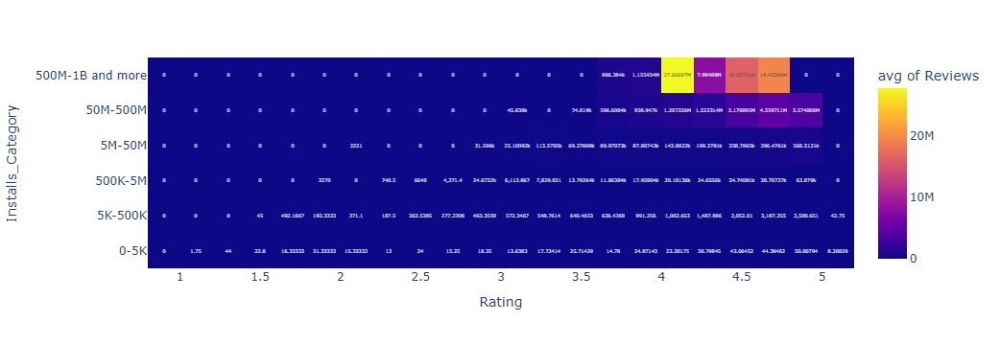

In [170]:
fig = px.density_heatmap(
    APP,
    x='Rating',
    y='Installs_Category',
    z='Reviews',
    histfunc="avg",
    category_orders={'Installs_Category': custom_order2},
    nbinsx=40,
    nbinsy=40,
    text_auto=True
)
fig.show()

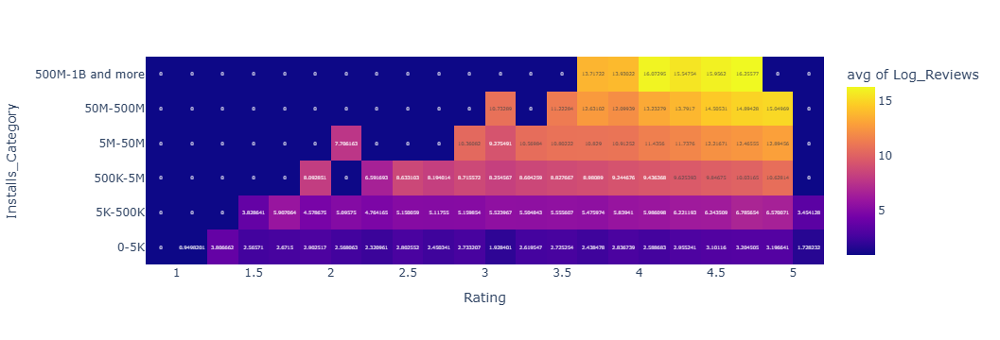

In [172]:
fig = px.density_heatmap(
    APP,
    x='Rating',
    y='Installs_Category',
    z='Log_Reviews',
    histfunc="avg",
    category_orders={'Installs_Category': custom_order2},
    nbinsx=40,
    nbinsy=40,
    text_auto=True
)
fig.show()

#### Come suggerirebbe la Heat Map - nella sua versione con **MEDIA DELLE REVIEWS** e **MEDIA DEI LOGARITMI DELLE REVIEWS** - , il **_tasso di partecipazione alla community_**, intesa come **numero medio reviews rilasciate** o **media dei logaritmi delle reviews rilasciate**,
#### crescerebbe di pari passo con il **livello di valutazione** `Rating` e il numero di Installazioni `Installs_Category` (con tassi decisamente più elevati) con un andamento di crescita da Sud-Ovest a Nord-Est:
> Le APP **più largamente diffuse** sono anche quelle che manifestano valutazioni di rating nella media **positive**, il che potrebbe **ridurre le probabilità di ottenere reviews negative** (tutto da dimostrare) e manifestando, dunque, la _non necessità_ da parte degli `Utenti` di notificare eventuali _reviews negative_ (oppure hanno tasso sul totale delle reviews molto basso). Il più delle volte gli utenti, esseri umani, potrebbero manifestare la propria opinione in maniera esplicita quando sono **coinvolti con APP che creano problemi**: è un fenomeno alquanto conosciuto il fatto che la **colletività manifesti il proprio scontento** quando le cose vanno male.
>
> Se una piattaforma funziona e se questo ideale è condiviso da più utenti che la scaricano, secondo questo ragionamento, non ci dovrebbe essere motivo di mettere alla gogna l'APP. Questo spiegherebbe il motivo per cui il **numero medio di reviews** si attesta a `0`, e si mantenga tale all'aumento del `Rating` all'aumentare del numero di installazioni `Installs_Category`, via via comprendendo un range più ampio di `Rating`. (Vedere prima e seconda riga `Installs_Category`)
>
Più è basso il `Rating`, più è basso il numero di download `Installs_Category`, più aumenta la probabilità di avere **reviews** per buona parte anche con valutazioni scarse [Bottom-Left]. Più il `Rating` si alza, più il numero di download `Installs_Category` aumenta, **più aumenterebbero il numero medio di reviews** la cui **quota di reviews negative diventa sempre più residuale** [Top-Right].  La positività di tali affermazioni va però valutata in altra sede.

Si può, tuttavia, valutare come, **a parità di numero di download** `Installs_Category`
> all'aumentare del `Rating` aumenti il **numero medio di reviews** - la supposizione è che la scala dei rating sia fatta su un numero sempre più robusto
> di reviews, la cui quota di reviews negative, rispetto al totale, sia via via minore, indice della qualità del prodotto, che dunque viene indicizzato con un rating positivo



### Correlazioni

In [176]:
corr = APP.select_dtypes(include=['int64','float64','int32']).corr()
corr

,Rating,Reviews,Installs,Log_Reviews
Rating,1.000000,0.056816,0.041973,0.184355
Reviews,0.056816,1.000000,0.619178,0.245297
Installs,0.041973,0.619178,1.000000,0.265908
Log_Reviews,0.184355,0.245297,0.265908,1.000000


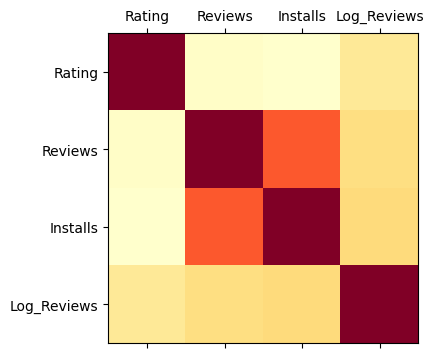

In [178]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(4,4))
plt.matshow(corr, cmap='YlOrRd', fignum=fig.number)
plt.xticks(range(len(corr.columns)), corr.columns);
plt.yticks(range(len(corr.columns)), corr.columns); #correlazione positiva medio-elevata in arancione

#### Andando più nel dettaglio, però, emergerebbe un fenomeno che mostra una correlazione di media intensità tra **numero di `Reviews`** e di **`Installs`**, molto più di quanto non si possa dire di `Reviews` con `Rating` per cui, in realtà, la correlazione sembra nulla
> Le `Reviews` presenterebbero un correlazione positiva con `Installs`: al crescere del numero di installazioni, cresce il numero di recensioni.

#### INFATTI, il seguente **grafico a bolle** mostra, in realtà, come buona parte delle `Installs` siano concentrate in prossimità di valutazioni alte del `Rating`:

> il _bacino di utenza_, rappresentato dalle `Reviews`, in quell'area è molto elevato (lo si nota essendo la variabile **dimensione** per le bolle). Clusterizzando le bolle per `Content Rating`, riusciamo ad individuare la correlazione tra `Installs` e `Reviews` e come una grandissima fetta delle App più scaricate siano indirizzate ad **un'ampia platea di utenti**, anche ai più **_psicologicamente sensibili agli stimoli_**, come i _Minori_ e i _Teenager_

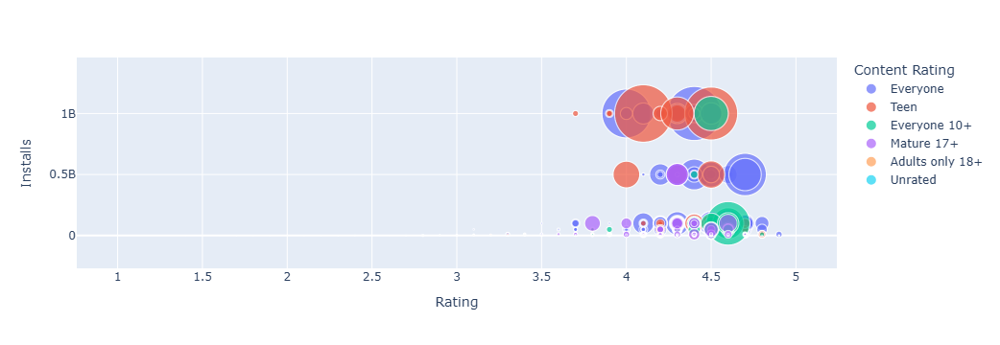

In [182]:

fig = px.scatter(APP, x="Rating", y="Installs",
	         size="Reviews", color = "Content Rating",
                log_y=False, size_max=60)
fig.show()



Possiamo mostrare, inoltre, come questo indirizzo sia in linea con quanto precedentemente detto, osservando il fenomeno con l'ausilio di una **SCALA LOGARITMICA** per la variabile `Installs`

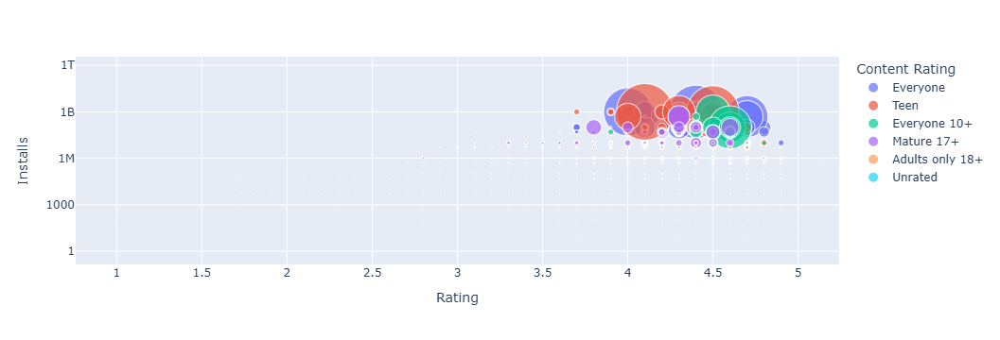

In [185]:

fig = px.scatter(APP, x="Rating", y="Installs",
	         size="Reviews", color = "Content Rating",
                log_y=True, size_max=60)
fig.show()


Risulta ulteriormente possibile mostrare questa distribuzione e la **magnitudine** del fenomeno mostrando come scala delle ordinate
il **quantitativo di `Reviews`**, per APP, rappresentato **CON BASE LOGARITMICA**

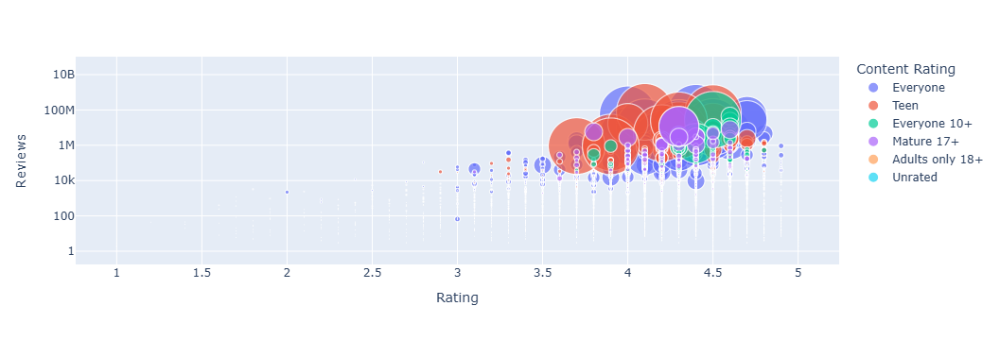

In [188]:
fig = px.scatter(APP, x="Rating", y="Reviews",
	         size="Installs", color = "Content Rating",
                log_y=True, size_max=60)
fig.show()

## Integrazione Dataset Reviews

![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

In [191]:
Reviews = pd.read_csv('googleplaystore_user_reviews.csv')
Reviews

,App,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity
0,10 Best Foods for You,I like eat delicious food. That's I'm cooking ...,Positive,1.00,0.533333
1,10 Best Foods for You,This help eating healthy exercise regular basis,Positive,0.25,0.288462
2,10 Best Foods for You,NaN,NaN,NaN,NaN
3,10 Best Foods for You,Works great especially going grocery store,Positive,0.40,0.875000
4,10 Best Foods for You,Best idea us,Positive,1.00,0.300000
...,...,...,...,...,...
64290,Houzz Interior Design Ideas,NaN,NaN,NaN,NaN
64291,Houzz Interior Design Ideas,NaN,NaN,NaN,NaN
64292,Houzz Interior Design Ideas,NaN,NaN,NaN,NaN
64293,Houzz Interior Design Ideas,NaN,NaN,NaN,NaN


### Data Cleaning

In [194]:
Reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64295 entries, 0 to 64294
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   App                     64295 non-null  object 
 1   Translated_Review       37427 non-null  object 
 2   Sentiment               37432 non-null  object 
 3   Sentiment_Polarity      37432 non-null  float64
 4   Sentiment_Subjectivity  37432 non-null  float64
dtypes: float64(2), object(3)
memory usage: 2.5+ MB


#### Valutando che 5 osservazioni presentano i `Sentiment` ma non la `Translated_Review` avremmo comunque il

In [197]:
37427/64295

0.582113694688545

#### delle osservazioni

Decido di mantenere le osservazioni con **tutti i campi non nulli**

In [201]:
Reviews = Reviews[Reviews['Translated_Review'].notna()
            & Reviews['Sentiment'].notna()
            & Reviews['Sentiment_Polarity'].notna()
            & Reviews['Sentiment_Subjectivity'].notna()]

Reviews.info()

<class 'pandas.core.frame.DataFrame'>
Index: 37427 entries, 0 to 64230
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   App                     37427 non-null  object 
 1   Translated_Review       37427 non-null  object 
 2   Sentiment               37427 non-null  object 
 3   Sentiment_Polarity      37427 non-null  float64
 4   Sentiment_Subjectivity  37427 non-null  float64
dtypes: float64(2), object(3)
memory usage: 1.7+ MB


In [203]:
Reviews

,App,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity
0,10 Best Foods for You,I like eat delicious food. That's I'm cooking ...,Positive,1.000000,0.533333
1,10 Best Foods for You,This help eating healthy exercise regular basis,Positive,0.250000,0.288462
3,10 Best Foods for You,Works great especially going grocery store,Positive,0.400000,0.875000
4,10 Best Foods for You,Best idea us,Positive,1.000000,0.300000
5,10 Best Foods for You,Best way,Positive,1.000000,0.300000
...,...,...,...,...,...
64222,Housing-Real Estate & Property,Most ads older many agents ..not much owner po...,Positive,0.173333,0.486667
64223,Housing-Real Estate & Property,"If photos posted portal load, fit purpose. I'm...",Positive,0.225000,0.447222
64226,Housing-Real Estate & Property,"Dumb app, I wanted post property rent give opt...",Negative,-0.287500,0.250000
64227,Housing-Real Estate & Property,I property business got link SMS happy perform...,Positive,0.800000,1.000000


#### Valutiamo le distribuzioni della `Sentiment_Polarity` e della `Sentiment_Subjectivity` sulla base del `Sentiment`

In [206]:
Reviews.describe()

,Sentiment_Polarity,Sentiment_Subjectivity
count,37427.000000,37427.000000
mean,0.182171,0.492770
std,0.351318,0.259904
min,-1.000000,0.000000
25%,0.000000,0.357143
50%,0.150000,0.514286
75%,0.400000,0.650000
max,1.000000,1.000000


#### La `Sentiment_Polarity` mostrerebbe una concentrazione della distribuzione più ampia - vedasi la deviazione standard, spostata più su valori negativi (motivata dal fatto che è atta monitorare un sentimento "polarizzato", o positivo o negativo [-1, 1]]).
#### La `Sentiment_Subjectivity` vede una distribuzione più schiacciata, compreso tra valori [0, 1], mostrando una concentrazione più nutrita attorno alla media, osservando il valore della deviazione standard

### Boxplot - Distribuzione della `Sentiment_Polarity` e della `Sentiment_Subjectivity`, per `Sentiment`
`

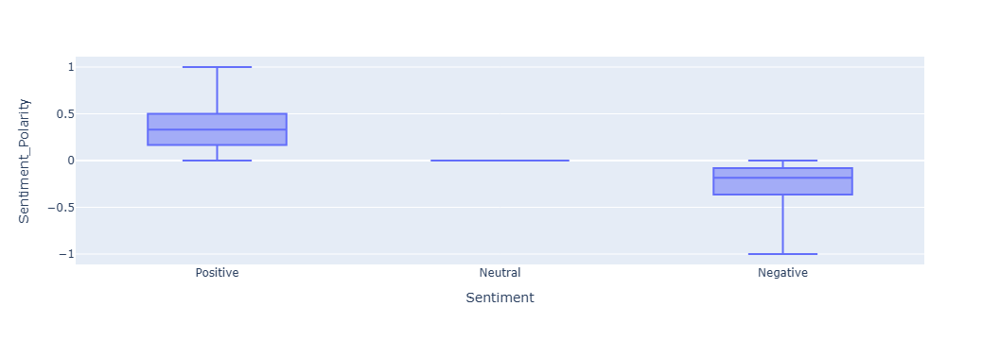

In [210]:
fig = px.box(Reviews, x="Sentiment", y = "Sentiment_Polarity", points=False)
fig.show()

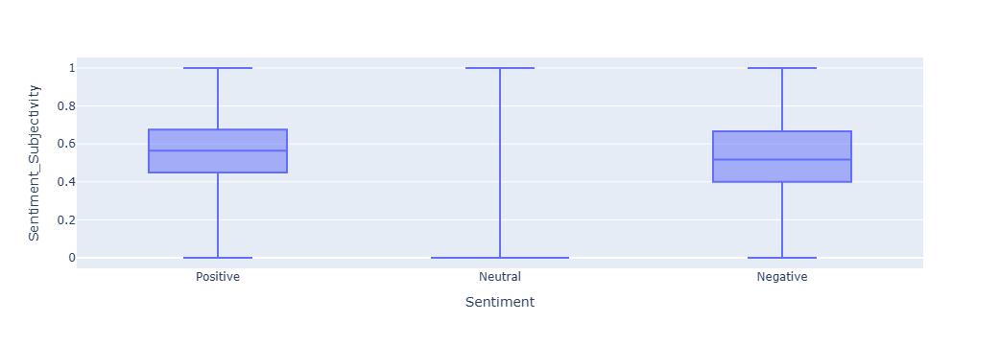

In [212]:
fig = px.box(Reviews, x="Sentiment", y="Sentiment_Subjectivity", points=False)
fig.show()

Il primo Box Plot, per quanto sia banale mostrare quanto sentimenti positivi o negativi si trovino al di sopra o al sotto della soglia 0 dell'indicatore, mostra inoltre che tali valutazioni, categorizzate come `Positive` o `Negative`, mantengono una **distribuzione della polarità molto concentrata ENTRO** la **prima metà degli indicatori**:
> per intenderci, il primo quartile q1 e il terzo 3q delle distribuzioni sono concentrati
> > tra `0,167` e `0,5` per i `Positive`
> >
> > tra `-0,08` e `-0,36` per i `Negative`
>
> La distribuzione del `Sentiment_Polarity` sembra molto concentrata, andando più nel merito delle valutazioni delle APP

Si può fare un discorso in linea per la `Sentiment_Subjectivity`, per cui viene mostrata una distribuzione simile per `Positive` e `Negative`, leggermente più concentrata per i **primi**

### Aggregazione del dataset Reviews. Calcolo della media delle viariabili `Sentiment_Polarity` e `Sentiment_Subjectivity`

Con le premesse rispettate, circa la distribuzione delle variabili appena citate, calcoliamo due indicatori, intesi come **MEDIE**, con l'obiettivo di utilizzarli come variabile nel dataset **`APP`** per ulteriori studi, collegandoli attraverso la **chiave primaria `App`** del **dataset Reviews**, ovvero il nome dell'APP, con la  **chiave primaria `App`** del **dataset APP**

### Creazione delle medie per le due variabili - Merge intermedio: Istanza *`Rev`*

In [218]:
SP = Reviews.groupby('App')['Sentiment_Polarity'].mean().to_frame()
SP = SP.reset_index()
SP

,App,Sentiment_Polarity
0,10 Best Foods for You,0.470733
1,104 找工作 - 找工作 找打工 找兼職 履歷健檢 履歷診療室,0.392405
2,11st,0.185943
3,1800 Contacts - Lens Store,0.318145
4,1LINE – One Line with One Touch,0.196290
...,...,...
860,Hotels.com: Book Hotel Rooms & Find Vacation D...,0.101622
861,Hotspot Shield Free VPN Proxy & Wi-Fi Security,0.251765
862,Hotstar,0.038178
863,Hotwire Hotel & Car Rental App,0.187029


In [220]:
SS = Reviews.groupby('App')['Sentiment_Subjectivity'].mean().to_frame()
SS = SS.reset_index()
SS

,App,Sentiment_Subjectivity
0,10 Best Foods for You,0.495455
1,104 找工作 - 找工作 找打工 找兼職 履歷健檢 履歷診療室,0.545516
2,11st,0.455340
3,1800 Contacts - Lens Store,0.591098
4,1LINE – One Line with One Touch,0.557315
...,...,...
860,Hotels.com: Book Hotel Rooms & Find Vacation D...,0.545444
861,Hotspot Shield Free VPN Proxy & Wi-Fi Security,0.393284
862,Hotstar,0.493964
863,Hotwire Hotel & Car Rental App,0.459717


In [222]:
APP

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Rating_Category,Installs_Category,Log_Reviews
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159.0,19M,10000,Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up,Ottimo,5K-500K,5.075174
1,Coloring book moana,ART_AND_DESIGN,3.9,967.0,14M,500000,Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up,Sufficiente-Buono,500K-5M,6.875232
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510.0,8.7M,5000000,Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up,Ottimo,5M-50M,11.379520
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644.0,25M,50000000,Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up,Ottimo,50M-500M,12.281389
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967.0,2.8M,100000,Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up,Ottimo,5K-500K,6.875232
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9703,Sya9a Maroc - FR,FAMILY,4.5,38.0,53M,5000,Free,0,Everyone,Education,"July 25, 2017",1.48,4.1 and up,Ottimo,5K-500K,3.663562
9704,Fr. Mike Schmitz Audio Teachings,FAMILY,5.0,4.0,3.6M,100,Free,0,Everyone,Education,"July 6, 2018",1.0,4.1 and up,Ottimo,0-5K,1.609438
9705,Parkinson Exercices FR,MEDICAL,NaN,3.0,9.5M,1000,Free,0,Everyone,Medical,"January 20, 2017",1.0,2.2 and up,Mancante,0-5K,1.386294
9706,The SCP Foundation DB fr nn5n,BOOKS_AND_REFERENCE,4.5,114.0,Varies with device,1000,Free,0,Mature 17+,Books & Reference,"January 19, 2015",Varies with device,Varies with device,Ottimo,0-5K,4.744932


In [224]:
Rev = pd.merge(SP, SS, how='inner', on = 'App')
Rev

,App,Sentiment_Polarity,Sentiment_Subjectivity
0,10 Best Foods for You,0.470733,0.495455
1,104 找工作 - 找工作 找打工 找兼職 履歷健檢 履歷診療室,0.392405,0.545516
2,11st,0.185943,0.455340
3,1800 Contacts - Lens Store,0.318145,0.591098
4,1LINE – One Line with One Touch,0.196290,0.557315
...,...,...,...
860,Hotels.com: Book Hotel Rooms & Find Vacation D...,0.101622,0.545444
861,Hotspot Shield Free VPN Proxy & Wi-Fi Security,0.251765,0.393284
862,Hotstar,0.038178,0.493964
863,Hotwire Hotel & Car Rental App,0.187029,0.459717


In [226]:
Rev.loc[Rev['App']=='Coloring book moana']

,App,Sentiment_Polarity,Sentiment_Subjectivity
384,Coloring book moana,0.152652,0.64154


#### Risultano complessivamente 865 APP di cui è possibile mappa una valutazione **MEDIA** in termini di `Sentiment`

### Merge APP con il DataFrame del dataset Reviews con l'istanza *`Rev`*

In [230]:
APP_Rev = pd.merge(APP, Rev, how='inner', on='App')

In [232]:
APP_Rev

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Rating_Category,Installs_Category,Log_Reviews,Sentiment_Polarity,Sentiment_Subjectivity
0,Coloring book moana,ART_AND_DESIGN,3.9,967.0,14M,500000,Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up,Sufficiente-Buono,500K-5M,6.875232,0.152652,0.641540
1,Garden Coloring Book,ART_AND_DESIGN,4.4,13791.0,33M,1000000,Free,0,Everyone,Art & Design,"September 20, 2017",2.9.2,3.0 and up,Ottimo,500K-5M,9.531844,0.268483,0.523447
2,FlipaClip - Cartoon animation,ART_AND_DESIGN,4.3,194216.0,39M,5000000,Free,0,Everyone,Art & Design,"August 3, 2018",2.2.5,4.0.3 and up,Ottimo,5M-50M,12.176731,0.412649,0.679226
3,Boys Photo Editor - Six Pack & Men's Suit,ART_AND_DESIGN,4.1,654.0,12M,100000,Free,0,Everyone,Art & Design,"March 20, 2018",1.1,4.0.3 and up,Ottimo,5K-500K,6.484635,0.283509,0.479298
4,Colorfit - Drawing & Coloring,ART_AND_DESIGN,4.7,20260.0,25M,500000,Free,0,Everyone,Art & Design;Creativity,"October 11, 2017",1.0.8,4.0.3 and up,Ottimo,500K-5M,9.916453,0.171836,0.572762
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
829,Amino: Communities and Chats,SOCIAL,4.8,1264084.0,62M,10000000,Free,0,Teen,Social,"August 7, 2018",1.8.19179,4.0.3 and up,Ottimo,5M-50M,14.049859,0.047590,0.537536
830,A+ Gallery - Photos & Videos,PHOTOGRAPHY,4.5,223941.0,Varies with device,10000000,Free,0,Everyone,Photography,"August 6, 2018",Varies with device,Varies with device,Ottimo,5M-50M,12.319142,0.208815,0.402870
831,Farm Heroes Saga,FAMILY,4.4,7615646.0,71M,100000000,Free,0,Everyone,Casual,"August 7, 2018",5.2.6,2.3 and up,Ottimo,50M-500M,15.845716,-0.011811,0.444434
832,Facebook Pages Manager,BUSINESS,4.0,1279800.0,Varies with device,50000000,Free,0,Everyone,Business,"August 6, 2018",Varies with device,Varies with device,Sufficiente-Buono,50M-500M,14.062215,-0.061083,0.440853


La motivazione della questa discrepanza delle osservazioni [da 865 di `Rev` a 834 dopo il *merge*], in termini di numerosità delle osservazioni, sta nel fatto che alcune delle APP, del dataset `APP`, non sono presenti nel dataset `Reviews`

In [235]:
corr = APP_Rev.select_dtypes(include=['int64','float64','int32']).corr()
corr

,Rating,Reviews,Installs,Log_Reviews,Sentiment_Polarity,Sentiment_Subjectivity
Rating,1.000000,0.084040,0.034937,0.309165,0.259487,0.218177
Reviews,0.084040,1.000000,0.473972,0.404877,-0.127148,-0.000962
Installs,0.034937,0.473972,1.000000,0.394689,-0.108670,0.013276
Log_Reviews,0.309165,0.404877,0.394689,1.000000,-0.203024,0.048888
Sentiment_Polarity,0.259487,-0.127148,-0.108670,-0.203024,1.000000,0.316214
Sentiment_Subjectivity,0.218177,-0.000962,0.013276,0.048888,0.316214,1.000000


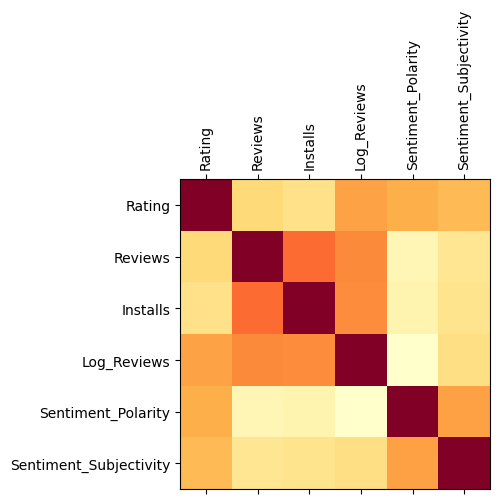

In [237]:
fig = plt.figure(figsize=(4,4))
plt.matshow(corr, cmap='YlOrRd', fignum=fig.number)
plt.xticks(range(len(corr.columns)), corr.columns, rotation='vertical');
plt.yticks(range(len(corr.columns)), corr.columns); #correlazione positiva medio-elevata in arancione

Rispetto a quanto precedente detto, l'aggiunta del datsaset sulle 100 Reviews più rilevanti, per APP, sembrerebbe non permetterci di assurgere ad informazioni ulteriormente significicative

# Conclusioni
![green-divider](https://user-images.githubusercontent.com/7065401/52071924-c003ad80-2562-11e9-8297-1c6595f8a7ff.png)

Sulla base dell'analisi svolta, pare abbastanza chiaro che
> `Family`,`Game` e `Tools` risultino tra le categorie più gettonate
> > sia in termini di **offerta**, sia di **domanda**, riuscendo probabilmente a raggiungere quote di mercato più ricercate e di nicchia;
> >
> > mostrano evidentemente una **`Barriera all'ingresso`**, in quanto la concorrenza è agguerrita anche a tassi di **download molto bassi**;
> 
> In relazione a quanto detto, aree strategiche potenzialmente interessanti (che potrebbero trasformarsi da **Dog** a **Question Mark**, secondo la
> matrice BCG) potrebbero essere `Beauty`, `Comics`, `Parenting`, `Events`, `Libraries and Demo` osservando quanto siano **poco densamente popolate**
> come _offerta_ e _domanda_.
>
> In più, come abbiamo potuto notare, la grande maggioranza di APP sono **gratuite**, e orientate ad un bacino di utenza che abbraccia **tutte le età**
>
L’obiettivo è costruire un APP che permetta immediatamente di **erodere le quote di mercato** di uno di questi settori, in modo tale da piazzarsi tra le prime App della categoria, e ottenere **alti tassi di download**.
Per garantire ciò, occorrerà costruire un'APP di qualità, ed incrementarne il livello, proponendo un **offerta di valore** tale da scalare le classifiche dei _download_.
Non si garantirà immediatamente il successo dell’APP ma, se supportati dalle **reviews**, potremo massimizzare il **rating**, riducendo i _tassi di valutazioni negative_, e rendere l’APP `APPetibile` ad un ampio spettro di utenti, **aumentando i download**.

Un settore interessante potrebbe essere quello del `Comics`, in forte crescita negli ultimi anni: con driver come **Yotube, Cruchyroll** e tutte le piattaforme di streaming Anime, che hanno reso il mondo del fumetto Giapponese accessibile più di quanto non facessero già le fumetterie, vendendo **Manga** e **Action Figure**, questo settore potrebbe essere la chiave per la crescita esponenziale della nostra APP.

**La nostra APP: FandomFury**

Sebbene il settore mostri comunque che una fetta di mercato delle APP sia indirizzata ad un **pubblico almeno adolescenziale**, potremmo creare un APP fruibile per utenti di tutte le età, facendo leva, però, sull'**EFFETTO NOSTALGIA** delle generazioni più affiliate, tra i _25 e i 40 anni_, che sono cresciute con il mito dei cartoni giapponesi (e non solo), e far appassionare anche le generazioni dei loro figli.

Informazioni su Fiere e come raggiungerle, Comicon e come partecipare, Cosplay più in voga, Action Figure e Fumetti di Tendenza. Tutto questo, in una sola APP.

#### **FandomFury**